## What factors impact London rent prices the most?

## 1. Problem Statement and Objectives

### 1.1. Problem Statement

Rent prices in London vary significantly across different areas, property types, and features. Understanding what factors drive these price differences is crucial for renters, landlords, and policymakers.

This study aims to analyze the **key factors influencing London rent prices** using machine learning techniques. Instead of just predicting rent prices, the focus is on identifying which property features have the **strongest impact on rental costs**.

### 1.2. Objectives

The main objectives of this project are:
1. **Identify the most influential factors** affecting London rental prices.
2. **Quantify the impact of each feature** (e.g., location, property size, number of rooms).
3. **Compare different machine learning models** to determine which best captures these relationships.
4. **Provide actionable insights** that could help renters make informed decisions and landlords set fair rental prices.

### 1.3. Key Questions

- Which property features (e.g., number of rooms, location, size) **impact rent prices the most**?  
- How much does **location influence pricing** compared to property features?  
- Are there **unexpected insights** (e.g., features that don’t impact rent as much as expected)?  

### 1.4. Scope

- Analyse housing data for key price determinants.
- Engineer relevant features to improve model performance.
- Implement and evaluate multiple models, ensuring robust comparison.
- Identify the most influential features in price prediction.

## 2. Exploratory Data Analysis

In [1]:
# Import libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV

In [43]:
# Load dataset
df_original = pd.read_csv("kaggle_london_house_price_data.csv")

In [44]:
# Display basic information about the dataset
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418201 entries, 0 to 418200
Data columns (total 28 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   fullAddress                                418201 non-null  object 
 1   postcode                                   418201 non-null  object 
 2   country                                    418201 non-null  object 
 3   outcode                                    418201 non-null  object 
 4   latitude                                   418201 non-null  float64
 5   longitude                                  418201 non-null  float64
 6   bathrooms                                  340270 non-null  float64
 7   bedrooms                                   377665 non-null  float64
 8   floorAreaSqM                               392991 non-null  float64
 9   livingRooms                                357701 non-null  float64
 10  tenure  

In [45]:
# Display first few rows
df_original.head()

,fullAddress,postcode,country,outcode,latitude,longitude,bathrooms,bedrooms,floorAreaSqM,livingRooms,...,saleEstimate_upperPrice,saleEstimate_confidenceLevel,saleEstimate_ingestedAt,saleEstimate_valueChange.numericChange,saleEstimate_valueChange.percentageChange,saleEstimate_valueChange.saleDate,history_date,history_price,history_percentageChange,history_numericChange
0,"Flat 9, 35 Furnival Street, London, EC4A 1JQ",EC4A 1JQ,England,EC4A,51.517282,-0.110314,1.0,1.0,45.0,1.0,...,630000.0,HIGH,2024-10-07T13:26:59.894Z,244000.0,68.539326,2010-03-30,1995-01-02,830000,NaN,NaN
1,"Flat 6, 35 Furnival Street, London, EC4A 1JQ",EC4A 1JQ,England,EC4A,51.517282,-0.110314,NaN,NaN,NaN,NaN,...,660000.0,MEDIUM,2024-10-07T13:26:59.894Z,425000.0,242.857143,2000-05-26,1995-01-02,830000,NaN,NaN
2,"Flat 35, Octavia House, Medway Street, London,...",SW1P 2TA,England,SW1P,51.495505,-0.132379,2.0,2.0,71.0,1.0,...,834000.0,MEDIUM,2025-01-10T11:04:57.114Z,49000.0,6.901408,2019-09-04,1995-01-03,249950,NaN,NaN
3,"24 Chester Court, Lomond Grove, London, SE5 7HS",SE5 7HS,England,SE5,51.478185,-0.092201,1.0,1.0,64.0,1.0,...,407000.0,HIGH,2024-10-07T13:26:59.894Z,28000.0,7.777778,2024-01-25,1995-01-03,32000,NaN,NaN
4,"18 Alexandra Gardens, London, N10 3RL",N10 3RL,England,N10,51.588774,-0.139599,1.0,4.0,137.0,2.0,...,1324000.0,HIGH,2024-10-07T13:26:59.894Z,81000.0,6.864407,2022-12-14,1995-01-03,133000,NaN,NaN


### 2.1. Data Cleaning & Handling Missing Values

In [46]:
# Create a copy of the original dataset for cleaning
df_pre_clean = df_original.copy()

Removing Unnecessary Columns

From observation we can already identify unnecessary columns like 'country', so lets get rid of these first.

In [47]:
# View column names to identify unnecessary columns
print(df_pre_clean.columns)

Index(['fullAddress', 'postcode', 'country', 'outcode', 'latitude',
       'longitude', 'bathrooms', 'bedrooms', 'floorAreaSqM', 'livingRooms',
       'tenure', 'propertyType', 'currentEnergyRating',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice',
       'saleEstimate_confidenceLevel', 'saleEstimate_ingestedAt',
       'saleEstimate_valueChange.numericChange',
       'saleEstimate_valueChange.percentageChange',
       'saleEstimate_valueChange.saleDate', 'history_date', 'history_price',
       'history_percentageChange', 'history_numericChange'],
      dtype='object')


From the list above the only cols relevant look like: "postcode", "latitude", "longitude", "bathrooms", "bedrooms", "floorAreaSqM", "livingRooms", "tenure", "propertyType", "currentEnergyRating", "rentEstimate_lowerPrice", "rentEstimate_currentPrice" "rentEstimate_upperPrice", "saleEstimate_lowerPrice", "saleEstimate_currentPrice", "saleEstimate_upperPrice".

In [48]:
# Define cols to keep
columns_to_keep = [
    "postcode", "latitude", "longitude", "bathrooms", "bedrooms", "floorAreaSqM", "livingRooms",
    "tenure", "propertyType", "currentEnergyRating", "rentEstimate_lowerPrice", "rentEstimate_currentPrice",
    "rentEstimate_upperPrice", "saleEstimate_lowerPrice", "saleEstimate_currentPrice", "saleEstimate_upperPrice"
]

In [49]:
# Create a new DataFrame with only the selected columns
df_clean1 = df_pre_clean[columns_to_keep].copy()

# Display updated DataFrame info
print("Updated Dataset After Dropping Unnecessary Columns:")
df_clean1.info()

Updated Dataset After Dropping Unnecessary Columns:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418201 entries, 0 to 418200
Data columns (total 16 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   postcode                   418201 non-null  object 
 1   latitude                   418201 non-null  float64
 2   longitude                  418201 non-null  float64
 3   bathrooms                  340270 non-null  float64
 4   bedrooms                   377665 non-null  float64
 5   floorAreaSqM               392991 non-null  float64
 6   livingRooms                357701 non-null  float64
 7   tenure                     406689 non-null  object 
 8   propertyType               417065 non-null  object 
 9   currentEnergyRating        333675 non-null  object 
 10  rentEstimate_lowerPrice    416460 non-null  float64
 11  rentEstimate_currentPrice  416460 non-null  float64
 12  rentEstimate_upperPrice    416460 

In [50]:
# Check for missing values in each column
missing_values = df_clean1.isnull().sum()

# Filter and display only columns with missing values
missing_columns = missing_values[missing_values > 0]
print("Columns with Missing Values:\n", missing_columns)

Columns with Missing Values:
 bathrooms                    77931
bedrooms                     40536
floorAreaSqM                 25210
livingRooms                  60500
tenure                       11512
propertyType                  1136
currentEnergyRating          84526
rentEstimate_lowerPrice       1741
rentEstimate_currentPrice     1741
rentEstimate_upperPrice       1741
saleEstimate_lowerPrice        640
saleEstimate_currentPrice      640
saleEstimate_upperPrice        640
dtype: int64


In [51]:
# Calculate percentage of missing values
missing_percentage = (missing_values / len(df_clean1)) * 100

# Filter only columns with missing values
missing_percentage = missing_percentage[missing_percentage > 0]

# Sort missing values in descending order
sorted_missing = missing_percentage.sort_values(ascending=False)

print(sorted_missing)

currentEnergyRating          20.211812
bathrooms                    18.634819
livingRooms                  14.466728
bedrooms                      9.692947
floorAreaSqM                  6.028202
tenure                        2.752743
rentEstimate_lowerPrice       0.416307
rentEstimate_currentPrice     0.416307
rentEstimate_upperPrice       0.416307
propertyType                  0.271640
saleEstimate_lowerPrice       0.153036
saleEstimate_currentPrice     0.153036
saleEstimate_upperPrice       0.153036
dtype: float64


Dealing with the top 4 missing values:

I'm going to drop 'currentEnergyRating' col.

Properties with 0 'bathrooms' will be asusmed to have shared bathrooms.

To deal with missing vlaues in 'livingRooms' and 'bedrooms', I will categorise properties into three groups:

bedrooms > 0 (has bedrooms)
livingRooms > 0 (has living rooms)
bedrooms == 0 and livingRooms == 0 (open-floor properties)

but first let's see if all the properties with 0 bedrooms also have 0 livingrooms

In [52]:
# Create a new version for modifications
df_noEnergy = df_clean1.copy()

# Drop 'currentEnergyRating' due to high missing values
df_noEnergy.drop(columns=['currentEnergyRating'], inplace=True)

print(df_noEnergy.columns)

Index(['postcode', 'latitude', 'longitude', 'bathrooms', 'bedrooms',
       'floorAreaSqM', 'livingRooms', 'tenure', 'propertyType',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice'],
      dtype='object')


In [53]:
df_clean2 = df_noEnergy.copy()

# Count properties where bedrooms are NaN
missing_bedrooms = df_clean2[df_clean2['bedrooms'].isna()].shape[0]

# Count properties where livingRooms are NaN
missing_livingrooms = df_clean2[df_clean2['livingRooms'].isna()].shape[0]

# Count properties where bedrooms are NaN and livingRooms > 0
bedrooms_na_livingrooms_nonzero = df_clean2[(df_clean2['bedrooms'].isna()) & (df_clean2['livingRooms'] > 0)].shape[0]

# Count properties where bedrooms > 0 and livingRooms is NaN
bedrooms_nonzero_livingrooms_na = df_clean2[(df_clean2['bedrooms'] > 0) & (df_clean2['livingRooms'].isna())].shape[0]

# Count properties where both bedrooms and livingRooms are NaN
open_floor_count = df_clean2[(df_clean2['bedrooms'].isna()) & (df_clean2['livingRooms'].isna())].shape[0]

print(f"Properties with missing bedrooms: {missing_bedrooms}")
print(f"Properties with missing living rooms: {missing_livingrooms}")
print(f"Properties with missing bedrooms but nonzero living rooms: {bedrooms_na_livingrooms_nonzero}")
print(f"Properties with nonzero bedrooms but missing living rooms: {bedrooms_nonzero_livingrooms_na}")
print(f"Properties with missing bedrooms and missing living rooms: {open_floor_count}")

Properties with missing bedrooms: 40536
Properties with missing living rooms: 60500
Properties with missing bedrooms but nonzero living rooms: 4470
Properties with nonzero bedrooms but missing living rooms: 24434
Properties with missing bedrooms and missing living rooms: 36066


Assumptions and Types of Properties:

Open-Floor Properties (36066):

    These are properties where both bedrooms and livingRooms are missing. These could be studio apartments or open-plan properties, where there are no distinct rooms (i.e., everything is combined in one large space). This category likely represents studio flats or properties with large, single living spaces.

Properties with Missing Bedrooms but Nonzero LivingRooms (4470):

    These could be properties with a shared living space (e.g., co-living spaces or student accommodation), where living rooms are present, but the bedroom information is missing. Alternatively, it could be a case where the property type is recorded incorrectly or where the property is a multi-room house without specified bedroom information.

Properties with Nonzero Bedrooms but Missing LivingRooms (24434):

    These could be properties where bedrooms are specified, but the living room is absent (e.g., studio apartments with no separate living room). Alternatively, this category could represent shared accommodations where the living room is not specified.

Properties Missing Bedrooms (40536):

    These could be non-residential properties (e.g., offices, warehouses, or commercial buildings) where the number of bedrooms isn't applicable, but there is data for other features (e.g., floor area, property type).

Properties Missing LivingRooms (60500):

    Similar to the missing bedrooms case, properties without livingRooms could be studio flats, commercial spaces, or shared accommodations. It's possible that some of these properties simply lack a clearly defined livingRooms field.

For open-floor properties (both bedrooms and livingRooms missing), set both to 0.

For properties with missing bedrooms (but nonzero livingRooms), impute bedrooms with the median.

For properties with missing livingRooms (but nonzero bedrooms), impute livingRooms with the median.

In [54]:
# Create a new version for modifications
df_clean3 = df_clean2.copy()

# Impute open-floor properties (both bedrooms and livingRooms missing)
df_clean3.loc[df_clean3['bedrooms'].isna() & df_clean3['livingRooms'].isna(), ['bedrooms', 'livingRooms']] = 0

# Impute missing bedrooms where livingRooms > 0 (use median)
df_clean3['bedrooms'] = df_clean3['bedrooms'].fillna(df_clean3['bedrooms'].median())

# Impute missing livingRooms where bedrooms > 0 (use median)
df_clean3['livingRooms'] = df_clean3['livingRooms'].fillna(df_clean3['livingRooms'].median())

# Print
print("Missing Values After Imputation:\n", df_clean3.isnull().sum())

Missing Values After Imputation:
 postcode                         0
latitude                         0
longitude                        0
bathrooms                    77931
bedrooms                         0
floorAreaSqM                 25210
livingRooms                      0
tenure                       11512
propertyType                  1136
rentEstimate_lowerPrice       1741
rentEstimate_currentPrice     1741
rentEstimate_upperPrice       1741
saleEstimate_lowerPrice        640
saleEstimate_currentPrice      640
saleEstimate_upperPrice        640
dtype: int64


In [55]:
# Impute missing bathrooms with median
df_clean3['bathrooms'] = df_clean3['bathrooms'].fillna(df_clean3['bathrooms'].median())

# Impute missing tenure with mode
df_clean3['tenure'] = df_clean3['tenure'].fillna(df_clean3['tenure'].mode()[0])

# Impute missing propertyType with mode
df_clean3['propertyType'] = df_clean3['propertyType'].fillna(df_clean3['propertyType'].mode()[0])

# Impute missing price estimates with median
price_columns = ['rentEstimate_lowerPrice', 'rentEstimate_currentPrice', 'rentEstimate_upperPrice',
                 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice']

for col in price_columns:
    df_clean3[col] = df_clean3[col].fillna(df_clean3[col].median())

print("Missing Values After Handling Remaining Missing Data:\n", df_clean3.isnull().sum())

Missing Values After Handling Remaining Missing Data:
 postcode                         0
latitude                         0
longitude                        0
bathrooms                        0
bedrooms                         0
floorAreaSqM                 25210
livingRooms                      0
tenure                           0
propertyType                     0
rentEstimate_lowerPrice          0
rentEstimate_currentPrice        0
rentEstimate_upperPrice          0
saleEstimate_lowerPrice          0
saleEstimate_currentPrice        0
saleEstimate_upperPrice          0
dtype: int64


In [56]:
# Impute missing floorAreaSqM with the median
df_clean3['floorAreaSqM'] = df_clean3['floorAreaSqM'].fillna(df_clean3['floorAreaSqM'].median())

print("Missing Values After Imputing floorAreaSqM:\n", df_clean3.isnull().sum())

Missing Values After Imputing floorAreaSqM:
 postcode                     0
latitude                     0
longitude                    0
bathrooms                    0
bedrooms                     0
floorAreaSqM                 0
livingRooms                  0
tenure                       0
propertyType                 0
rentEstimate_lowerPrice      0
rentEstimate_currentPrice    0
rentEstimate_upperPrice      0
saleEstimate_lowerPrice      0
saleEstimate_currentPrice    0
saleEstimate_upperPrice      0
dtype: int64


## 2.2 Feature Exploration

In [57]:
df_featureExplore = df_clean3.copy()

In [58]:
#Display basic statistics for numerical columns
print("Summary Statistics for Numerical Features:\n", df_featureExplore.describe())

Summary Statistics for Numerical Features:
             latitude      longitude      bathrooms       bedrooms  \
count  418201.000000  418201.000000  418201.000000  418201.000000   
mean       51.507522      -0.101426       1.361477       2.256372   
std         0.056171       0.086930       0.676007       1.303505   
min        51.385708      -0.347055       1.000000       0.000000   
25%        51.464315      -0.155996       1.000000       1.000000   
50%        51.501581      -0.108482       1.000000       2.000000   
75%        51.548515      -0.043582       2.000000       3.000000   
max        51.665823       0.139249       9.000000       9.000000   

        floorAreaSqM    livingRooms  rentEstimate_lowerPrice  \
count  418201.000000  418201.000000            418201.000000   
mean       98.026741       1.155198              3295.103192   
std        54.342897       0.642279              3162.613309   
min        10.000000       0.000000               300.000000   
25%        64.

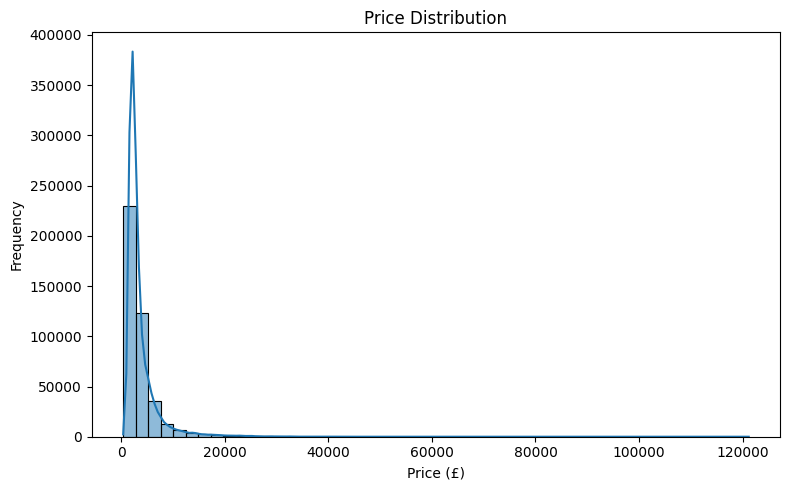

In [59]:
# Visualising price distribution
plt.figure(figsize=(8, 5))
sns.histplot(df_featureExplore['rentEstimate_currentPrice'], bins=50, kde=True)
plt.xlabel("Price (£)")
plt.ylabel("Frequency")
plt.title("Price Distribution")
plt.tight_layout()
plt.show()

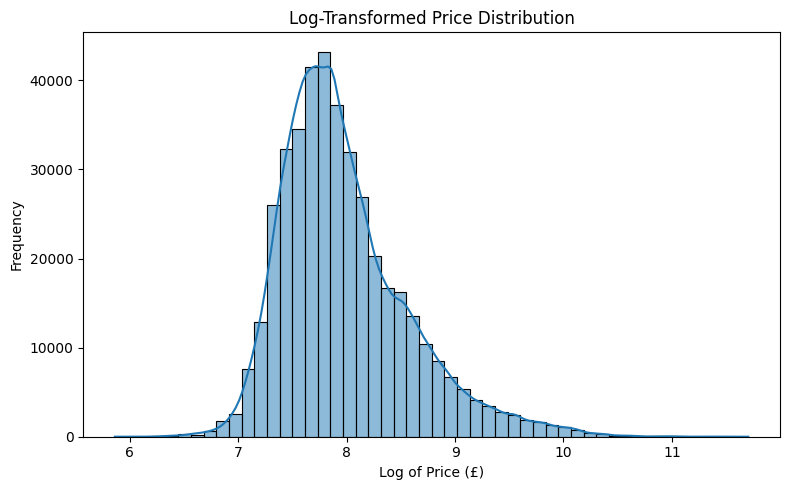

In [60]:
# Log transformation to reduce skewness
df_featureExplore['log_rentEstimate_currentPrice'] = df_featureExplore['rentEstimate_currentPrice'].apply(lambda x: np.log(x + 1))

# Visualising the log-transformed price distribution
plt.figure(figsize=(8, 5))
sns.histplot(df_featureExplore['log_rentEstimate_currentPrice'], bins=50, kde=True)
plt.xlabel("Log of Price (£)")
plt.ylabel("Frequency")
plt.title("Log-Transformed Price Distribution")
plt.tight_layout()
plt.show()

A log value of 7 corresponds to about £1,100.

A log value of 8 corresponds to about £3,000.

A log value of 9 corresponds to about £8,100.

A log value of 10 corresponds to about £22,000.

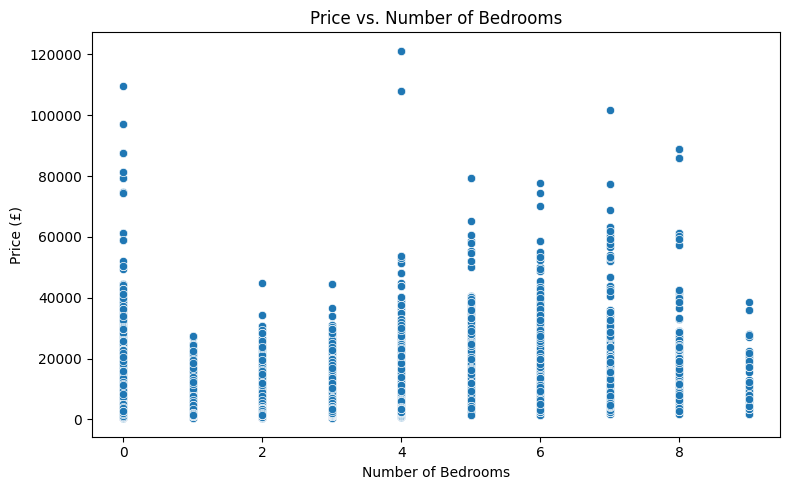

In [61]:
# Visualising the relationship between bedrooms and price
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df_featureExplore['bedrooms'], y=df_featureExplore['rentEstimate_currentPrice'])
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price (£)")
plt.title("Price vs. Number of Bedrooms")
plt.tight_layout()
plt.show()

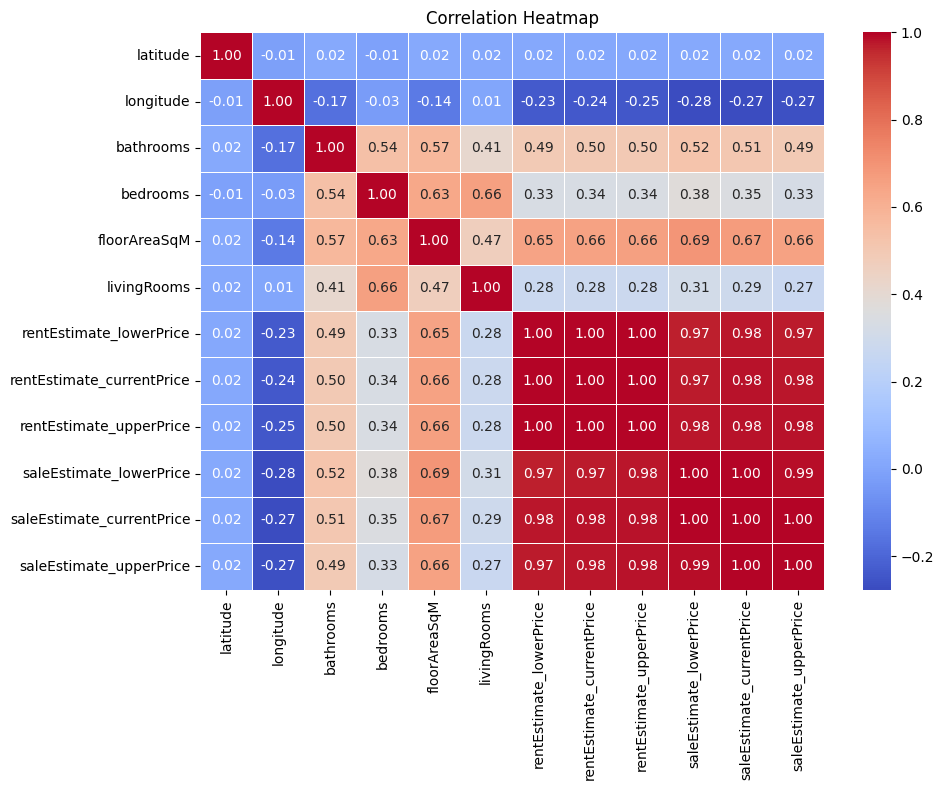

In [62]:
# Select only numeric columns for correlation
numeric_columns1 = df_clean3.select_dtypes(include=['float64', 'int64'])

# Correlation heatmap to explore relationships between numeric features
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns1.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

Dropping 'rentEstimate_lowerPrice', 'rentEstimate_upperPrice', 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice'

In [63]:
# Drop highly correlated rentEstimate columns
df_drop_matrix = df_clean3.drop(columns=['rentEstimate_lowerPrice', 'rentEstimate_upperPrice', 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice'])

# Confirm the columns after removal
print("Columns After Dropping Redundant rentEstimate Columns:\n", df_clean3.columns)


Columns After Dropping Redundant rentEstimate Columns:
 Index(['postcode', 'latitude', 'longitude', 'bathrooms', 'bedrooms',
       'floorAreaSqM', 'livingRooms', 'tenure', 'propertyType',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice'],
      dtype='object')


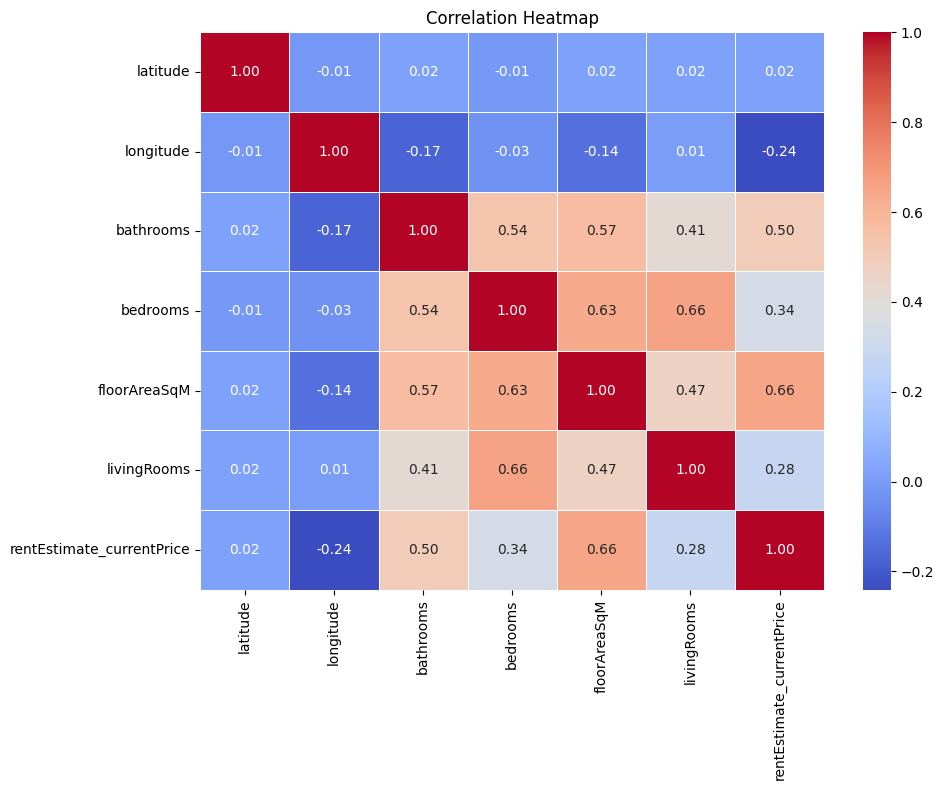

In [64]:
# Select only numeric columns for correlation
numeric_columns2 = df_drop_matrix.select_dtypes(include=['float64', 'int64'])

# Correlation heatmap to explore relationships between numeric features
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns2.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

In [65]:
# Create a base map centered around the average location
map_center = [df_featureExplore['latitude'].mean(), df_featureExplore['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=10)

# Create a list of locations and prices (lat, long, price)
locations = df_featureExplore[['latitude', 'longitude', 'rentEstimate_currentPrice']].dropna()

# Prepare the data in the form of (latitude, longitude, price) for the heatmap
heat_data = [[row['latitude'], row['longitude'], row['rentEstimate_currentPrice']] for index, row in locations.iterrows()]

# Add the heatmap to the map
HeatMap(heat_data).add_to(mymap)

# Display the map
mymap

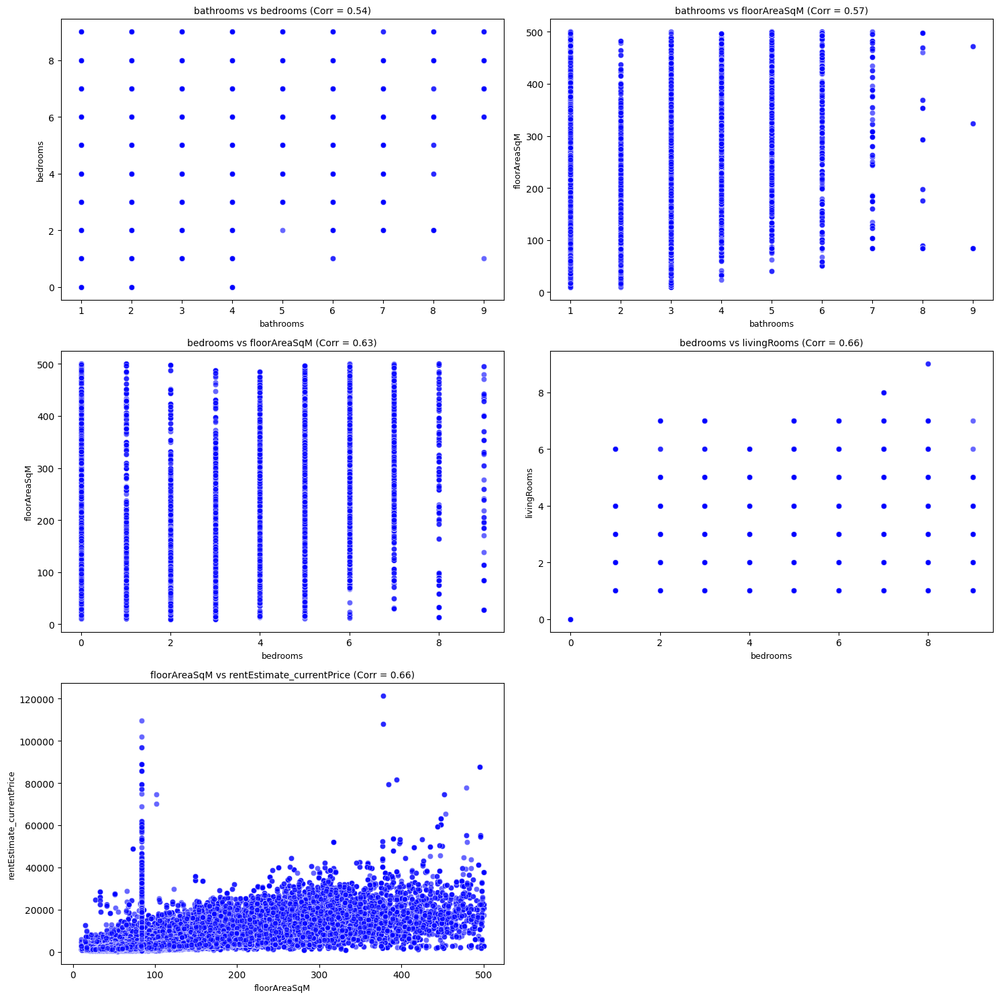

In [66]:
# Calculate the correlation matrix
corr_matrix = numeric_columns2.corr()

# Identify pairs of features with correlation > 0.5 or < -0.5
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr = corr_matrix.iloc[i, j]
        if abs(corr) > 0.5:
            high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr))

# Subplot layout
n_pairs = len(high_corr_pairs)
n_cols = 2
n_rows = (n_pairs + n_cols - 1) // n_cols  # required rows

# figure with subplots
plt.figure(figsize=(15, 5 * n_rows))
for idx, (col1, col2, corr) in enumerate(high_corr_pairs, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.scatterplot(x=numeric_columns2[col1], y=numeric_columns2[col2], color='blue', alpha=0.6)
    plt.title(f'{col1} vs {col2} (Corr = {corr:.2f})', fontsize=10)
    plt.xlabel(col1, fontsize=9)
    plt.ylabel(col2, fontsize=9)

plt.tight_layout()
plt.show()

<ipython-input-67-eb5a32a7caef>:20: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


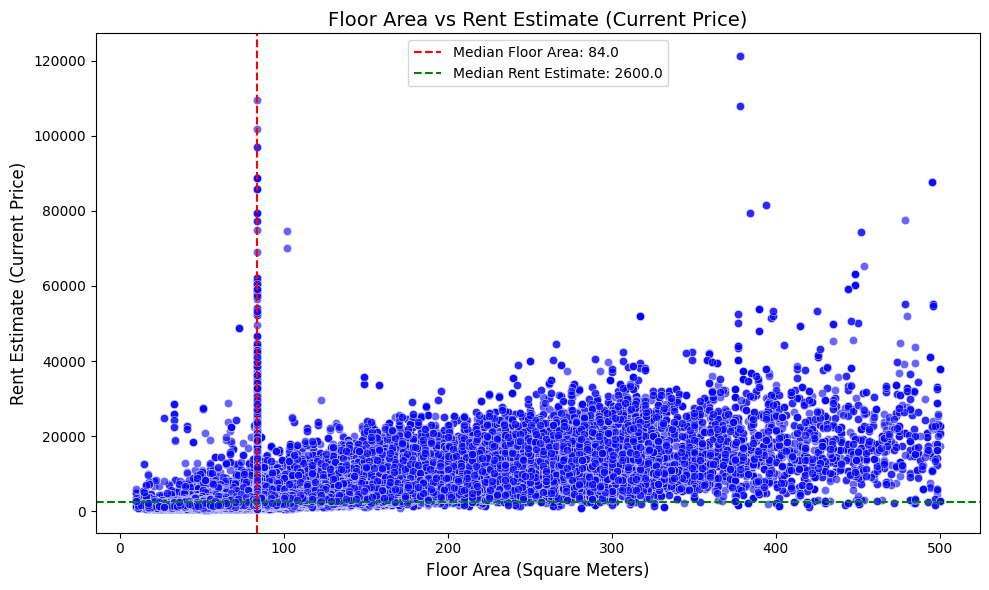

In [67]:
# Calculate the median values
median_floor_area = df_clean3['floorAreaSqM'].median()
median_rent = df_clean3['rentEstimate_currentPrice'].median()

# Scatter plot of floorAreaSqM vs rentEstimate_currentPrice
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_clean3['floorAreaSqM'], y=df_clean3['rentEstimate_currentPrice'], color='blue', alpha=0.6)

# Highlight the median with lines
plt.axvline(median_floor_area, color='red', linestyle='--', label=f'Median Floor Area: {median_floor_area}')
plt.axhline(median_rent, color='green', linestyle='--', label=f'Median Rent Estimate: {median_rent}')

# Add labels and title
plt.title('Floor Area vs Rent Estimate (Current Price)', fontsize=14)
plt.xlabel('Floor Area (Square Meters)', fontsize=12)
plt.ylabel('Rent Estimate (Current Price)', fontsize=12)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

## 3. Feature Engineering & Preprocessing

### Step 3.1: Encoding Categorical Variables

In [68]:
# Perform One-Hot Encoding on the 'tenure' and 'propertyType' columns
df_clean4 = pd.get_dummies(df_clean3, columns=['tenure', 'propertyType'], drop_first=True)

# Check the first few rows to see the result
print(df_clean4.head())

   postcode   latitude  longitude  bathrooms  bedrooms  floorAreaSqM  \
0  EC4A 1JQ  51.517282  -0.110314        1.0       1.0          45.0   
1  EC4A 1JQ  51.517282  -0.110314        1.0       0.0          84.0   
2  SW1P 2TA  51.495505  -0.132379        2.0       2.0          71.0   
3   SE5 7HS  51.478185  -0.092201        1.0       1.0          64.0   
4   N10 3RL  51.588774  -0.139599        1.0       4.0         137.0   

   livingRooms  rentEstimate_lowerPrice  rentEstimate_currentPrice  \
0          1.0                   2100.0                     2350.0   
1          0.0                   2100.0                     2350.0   
2          1.0                   2650.0                     2950.0   
3          1.0                   1850.0                     2000.0   
4          2.0                   4350.0                     4850.0   

   rentEstimate_upperPrice  ...  propertyType_Mid Terrace Bungalow  \
0                   2600.0  ...                              False   
1     

### 3.2 Scaling Numeric Features:

In [69]:
# List of numeric columns to scale
numeric_columns = ['floorAreaSqM', 'bathrooms', 'bedrooms', 'livingRooms', 'rentEstimate_currentPrice']

# Initialize StandardScaler
scaler = StandardScaler()

# Scale numeric features
df_clean4[numeric_columns] = scaler.fit_transform(df_clean4[numeric_columns])

print(df_clean4[numeric_columns].head())

   floorAreaSqM  bathrooms  bedrooms  livingRooms  rentEstimate_currentPrice
0     -0.975782  -0.534724 -0.963843    -0.241637                  -0.369174
1     -0.258116  -0.534724 -1.731006    -1.798594                  -0.369174
2     -0.497338   0.944552 -0.196679    -0.241637                  -0.196819
3     -0.626150  -0.534724 -0.963843    -0.241637                  -0.469715
4      0.717174  -0.534724  1.337648     1.315320                   0.348974


### 3.3 Create New Features:

In [70]:
# Create a new column for price per square meter
df_clean4['price_per_sqm'] = df_clean4['rentEstimate_currentPrice'] / df_clean4['floorAreaSqM']

print(df_clean4[['rentEstimate_currentPrice', 'floorAreaSqM', 'price_per_sqm']].head())

   rentEstimate_currentPrice  floorAreaSqM  price_per_sqm
0                  -0.369174     -0.975782       0.378337
1                  -0.369174     -0.258116       1.430267
2                  -0.196819     -0.497338       0.395745
3                  -0.469715     -0.626150       0.750164
4                   0.348974      0.717174       0.486596


To calculate the Distance from City Centre using latitude and longitude, we can use the Haversine formula.

We'll need the latitude and longitude of Central London (from Google: latitude = 51.5074, longitude = -0.1278).

In [71]:
# Function to calculate the distance using Haversine formula
def haversine(lat1, lon1, lat2, lon2):
    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    # Earth's radius in kilometers
    R = 6371.0
    distance = R * c  # distance in kilometers
    return distance

# Coordinates for Central London
central_london_lat = 51.5074
central_london_lon = -0.1278

# Calculate the distance for each property in the dataset
df_clean4['distance_from_centre'] = df_clean4.apply(
    lambda row: haversine(row['latitude'], row['longitude'], central_london_lat, central_london_lon),
    axis=1
)

print(df_clean4[['latitude', 'longitude', 'distance_from_centre']].head())


    latitude  longitude  distance_from_centre
0  51.517282  -0.110314              1.634534
1  51.517282  -0.110314              1.634534
2  51.495505  -0.132379              1.360143
3  51.478185  -0.092201              4.077599
4  51.588774  -0.139599              9.085086


## 4. Modeling Approaches

### 4.1. Traditional Machine Learning Models

4.1.1. Splitting the Data

In [72]:
# Features (X) - All columns except the target variable 'rentEstimate_currentPrice'
X = numeric_columns2.drop(columns=['rentEstimate_currentPrice'])

# Target (y) - The rent estimate current price
y = numeric_columns2['rentEstimate_currentPrice']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(334560, 6) (83641, 6) (334560,) (83641,)


In [73]:
# Define features and target variable
X = numeric_columns2.drop(columns=["rentEstimate_currentPrice"])  # Replace "price" with actual target column name
y = numeric_columns2["rentEstimate_currentPrice"]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(334560, 6) (83641, 6) (334560,) (83641,)


In [74]:
# Train Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Make predictions
y_pred = lr_model.predict(X_test)

# Evaluate model performance
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Linear Regression Performance:\nMAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.4f}")

Linear Regression Performance:
MAE: 1244.16
RMSE: 2485.01
R²: 0.4917


#### 4.1.2. Random Forest

In [75]:
# Train a Random Forest model
rf_model = RandomForestRegressor(n_estimators=50, max_depth=20, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate model performance
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Performance:\nMAE: {mae_rf:.2f}\nRMSE: {rmse_rf:.2f}\nR²: {r2_rf:.4f}")

Random Forest Performance:
MAE: 319.33
RMSE: 893.55
R²: 0.9343


Random Forest model has significantly improved performance compared to Linear Regression:

    * MAE reduced from 1244.16 → 319.33

    * RMSE reduced from 2485.01 → 893.55

    * R² increased from 0.4917 → 0.9343

In [76]:
# Train XGBoost model
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate XGBoost model
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost Performance:\nMAE: {mae_xgb:.2f}\nRMSE: {rmse_xgb:.2f}\nR²: {r2_xgb:.4f}")

XGBoost Performance:
MAE: 713.68
RMSE: 1600.43
R²: 0.7892


In [77]:
# Train LightGBM model
lgbm_model = LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
lgbm_model.fit(X_train, y_train)
y_pred_lgbm = lgbm_model.predict(X_test)

# Evaluate LightGBM model
mae_lgbm = mean_absolute_error(y_test, y_pred_lgbm)
rmse_lgbm = np.sqrt(mean_squared_error(y_test, y_pred_lgbm))
r2_lgbm = r2_score(y_test, y_pred_lgbm)

print(f"LightGBM Performance:\nMAE: {mae_lgbm:.2f}\nRMSE: {rmse_lgbm:.2f}\nR²: {r2_lgbm:.4f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 794
[LightGBM] [Info] Number of data points in the train set: 334560, number of used features: 6
[LightGBM] [Info] Start training from score 3634.640423
LightGBM Performance:
MAE: 718.06
RMSE: 1540.28
R²: 0.8047


Key Observations:

* Random Forest performed the best with the lowest error and highest R².

* XGBoost & LightGBM are better than Linear Regression but not as good as Random Forest.

* LightGBM slightly outperformed XGBoost, with a lower RMSE and higher R².

* XGBoost & LightGBM might need hyperparameter tuning to improve performance.

### 4.1.3 Feature Importance Analysis

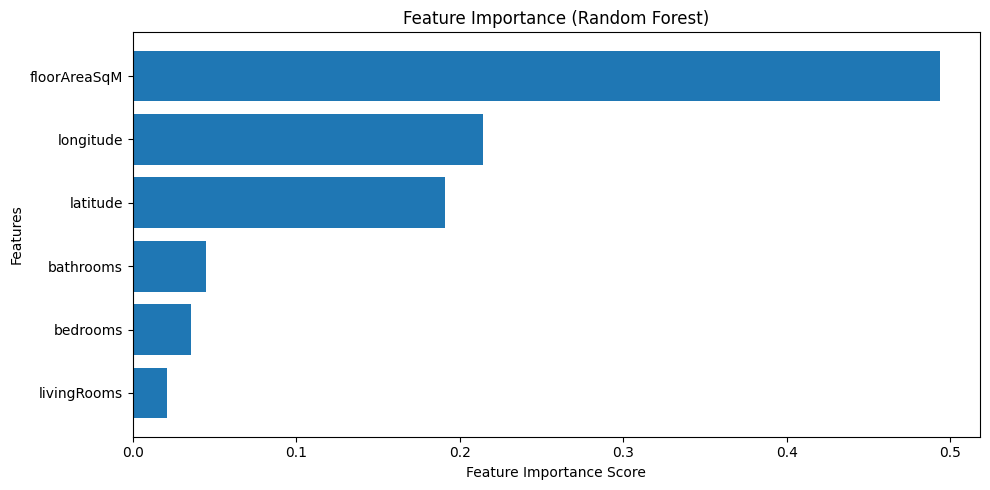

In [78]:
# get feature importance from random forest
feature_importance = rf_model.feature_importances_

# create a df for visualisation
features_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})
features_df = features_df.sort_values(by='Importance', ascending=False)

# plot feature importance
plt.figure(figsize=(10, 5))
plt.barh(features_df['Feature'], features_df['Importance'])
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Feature Importance (Random Forest)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### 4.2. Neural Network Model

In [79]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [40]:
# define the neural network model
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),  # input layer
    BatchNormalization(),  # normalise activations
    Dropout(0.2),  # prevent overfitting
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dense(1)  # output layer
])

# compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# define early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# train the model with early stopping
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - loss: 26403108.0000 - mae: 3639.7205 - val_loss: 20912370.0000 - val_mae: 3206.3071
Epoch 2/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - loss: 19010734.0000 - mae: 2875.2932 - val_loss: 12472493.0000 - val_mae: 2212.9441
Epoch 3/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - loss: 10808302.0000 - mae: 1836.1523 - val_loss: 10020435.0000 - val_mae: 1575.0416
Epoch 4/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 8432925.0000 - mae: 1346.5671 - val_loss: 8715137.0000 - val_mae: 1221.2451
Epoch 5/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - loss: 7696802.0000 - mae: 1288.9666 - val_loss: 9868675.0000 - val_mae: 1194.3054
Epoch 6/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - loss: 7130627.5000 - mae: 1287.3124 - val_loss: 78709192.0000 - val_mae: 1527.9847
Epoch 7/50
3225/3225 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - loss: 7010892.0000 - mae: 1276.4482 - val_loss: 62063768.0000 - val_mae: 1370.2985
Epoch 8/50
3225/322

* Model Might Be Overfitting
* Validation loss is increasing, which suggests overfitting.

In [41]:
from tensorflow.keras.regularizers import l2

In [80]:
# fixed model
model = Sequential([
    keras.Input(shape=(X_train.shape[1],)),  # input layer
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.3),  # increased dropout to 0.3
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.3),
    Dense(16, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dense(1)  # output layer
])

# compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# change early stopping patience to 10
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10, # changed to 10 from 5
    restore_best_weights=True
)


# train the model with early stopping
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 41s 4ms/step - loss: 22162156.0000 - mae: 3332.9028 - val_loss: 9801080.0000 - val_mae: 1855.1952
Epoch 2/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 41s 4ms/step - loss: 7864322.0000 - mae: 1459.5756 - val_loss: 14228217.0000 - val_mae: 1239.4790
Epoch 3/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 42s 4ms/step - loss: 6645913.0000 - mae: 1284.8745 - val_loss: 74713128.0000 - val_mae: 1243.7745
Epoch 4/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 83s 4ms/step - loss: 6483574.5000 - mae: 1277.3629 - val_loss: 105998472.0000 - val_mae: 1288.1061
Epoch 5/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 38s 4ms/step - loss: 6568657.5000 - mae: 1278.8815 - val_loss: 5980310.0000 - val_mae: 1185.1855
Epoch 6/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - loss: 6358603.0000 - mae: 1261.7382 - val_loss: 7463138.0000 - val_mae: 1207.8477
Epoch 7/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 40s 4ms/step - loss: 6334750.0000 - mae: 1261.6024 - val_loss: 13170319.0000 - val_mae: 1217.9348
Epoch 8

* Training loss & MAE decrease steadily in the first few epochs.
* Validation loss & MAE improve initially but later fluctuate, indicating potential overfitting.
* After epoch 5, validation loss jumps significantly, suggesting that the model is memorising training data rather than generalising well.

In [81]:
# define the neural network model
model = Sequential([
    keras.Input(shape=(X_train.shape[1],)),  # input layer
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),  # reduced L2 regularisation
    BatchNormalization(),
    Dropout(0.4),  # increased dropout to 0.4
    Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(0.4),
    Dense(16, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dense(1)  # output layer
])

# define a lower learning rate for Adam optimizer
optimizer = keras.optimizers.Adam(learning_rate=0.0005)

# compile the model
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

# define early stopping callback with increased patience
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,  # increased patience from 10 to 15
    restore_best_weights=True
)

# train the model with early stopping
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 48s 4ms/step - loss: 24277714.0000 - mae: 3551.1687 - val_loss: 19032332.0000 - val_mae: 3090.5820
Epoch 2/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 40s 4ms/step - loss: 16775043.0000 - mae: 2756.4075 - val_loss: 10202553.0000 - val_mae: 1871.5919
Epoch 3/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - loss: 9043245.0000 - mae: 1634.5250 - val_loss: 10887044.0000 - val_mae: 1191.1602
Epoch 4/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 40s 4ms/step - loss: 6821452.0000 - mae: 1283.9346 - val_loss: 6032290.0000 - val_mae: 1130.0964
Epoch 5/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 52s 5ms/step - loss: 6971028.5000 - mae: 1319.1986 - val_loss: 10869209.0000 - val_mae: 1270.8319
Epoch 6/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 69s 4ms/step - loss: 6929309.5000 - mae: 1315.1713 - val_loss: 26885046.0000 - val_mae: 1261.5642
Epoch 7/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 37s 4ms/step - loss: 6752297.0000 - mae: 1301.0183 - val_loss: 6375645.5000 - val_mae: 1156.2086
Epoch 

Observations:
* Good early progress: The first 8 epochs show a steady decline in validation loss (val_loss) and MAE.
* Validation loss spikes at epoch 12: This suggests the model is overfitting.
* After epoch 12, validation loss increases significantly, while training loss stays stable.
* Early stopping kicked in too late (patience was 15), allowing the model to overfit further.

In [82]:
# define the neural network model with reduced complexity
model = Sequential([
    keras.Input(shape=(X_train.shape[1],)),  # input layer
    Dense(32, activation='relu', kernel_regularizer=l2(0.001)),  # reduced neurons
    BatchNormalization(),
    Dropout(0.5),  # increased dropout to 0.5
    Dense(16, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(8, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dense(1)  # output layer
])

# define a lower learning rate
optimizer = keras.optimizers.Adam(learning_rate=0.0003)

# compile the model
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

# define early stopping callback with lower patience
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,  # reduced patience from 15 to 7
    restore_best_weights=True
)

# train the model with early stopping
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 42s 4ms/step - loss: 25528224.0000 - mae: 3628.5215 - val_loss: 24011196.0000 - val_mae: 3532.1199
Epoch 2/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 38s 4ms/step - loss: 23060298.0000 - mae: 3458.3174 - val_loss: 20989294.0000 - val_mae: 3260.9895
Epoch 3/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - loss: 20303236.0000 - mae: 3155.5730 - val_loss: 16781306.0000 - val_mae: 2826.0015
Epoch 4/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - loss: 16379937.0000 - mae: 2712.0371 - val_loss: 13506283.0000 - val_mae: 2417.4338
Epoch 5/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 42s 4ms/step - loss: 12583747.0000 - mae: 2184.1848 - val_loss: 9000291.0000 - val_mae: 1692.9927
Epoch 6/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 38s 4ms/step - loss: 9578684.0000 - mae: 1697.7759 - val_loss: 7517269.5000 - val_mae: 1409.6324
Epoch 7/50
10455/10455 ━━━━━━━━━━━━━━━━━━━━ 37s 3ms/step - loss: 8033120.0000 - mae: 1395.0125 - val_loss: 5868401.5000 - val_mae: 1145.7998
Epoc

Progress Summary:
Training stability
* Training MAE decreased steadily from 3700+ to ~1386.
* Training loss remains smooth without sudden spikes.

Validation improvement
* Validation MAE dropped from 3731 to ~1179–1290 range, then stabilised.
* Lowest val_loss: ~6994440.5
* Lowest val_mae: ~1179.75 at epoch 28

No overfitting spike like before
* Unlike previous models, the validation loss didn’t suddenly increase, indicating improved generalisation.

### 4.2.1 Evaluate the Model (MAE, RMSE, R²)

In [83]:
# make predictions
y_pred = model.predict(X_test)

# calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# results
print(f"Neural Network Performance:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.4f}")

2614/2614 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
Neural Network Performance:
MAE: 1165.85
RMSE: 2384.32
R²: 0.5321


Neural Network Performance
* The neural network did not perform as well as expected, achieving an R² of only 0.48, meaning it explains only 48% of the variance in house prices.

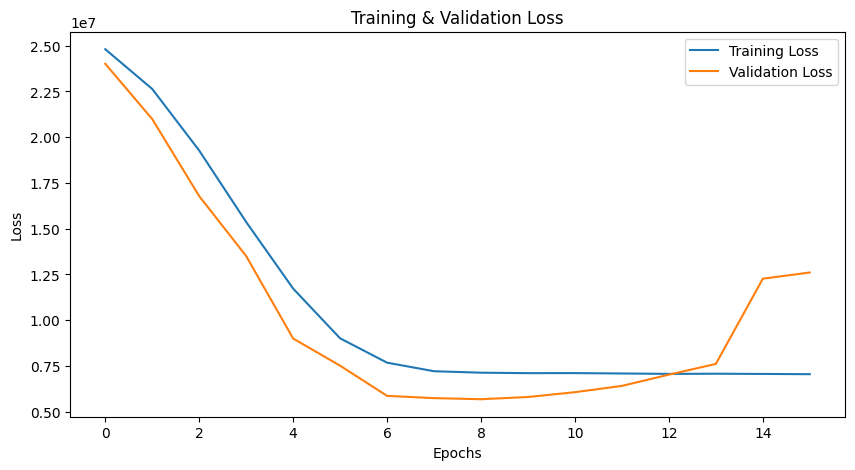

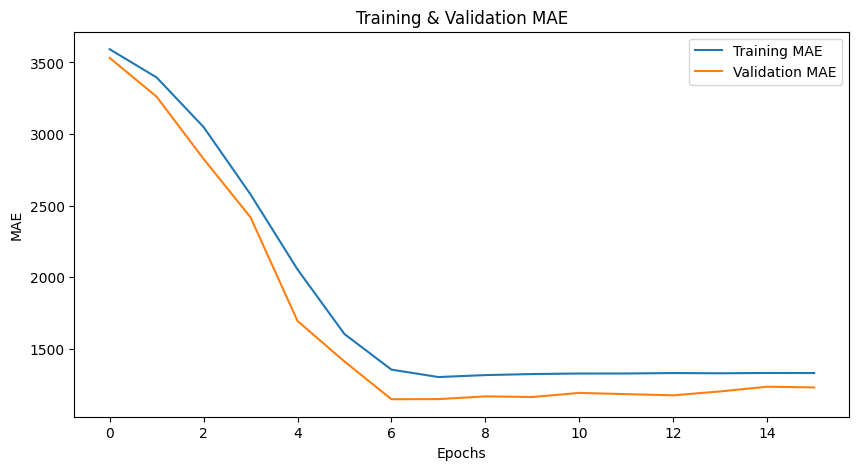

In [84]:
# plot training & validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.show()

# plot training & validation MAE
plt.figure(figsize=(10, 5))
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.title('Training & Validation MAE')
plt.legend()
plt.show()


The training loss graph shows that the neural network model did not overfit, as training and validation loss converge smoothly. However, its predictive power remains weak compared to Random Forest.

In [85]:
# train Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# train XGBoost model
xgb = XGBRegressor(n_estimators=100, learning_rate=0.05, random_state=42)
xgb.fit(X_train, y_train)
xgb_pred = xgb.predict(X_test)

# evaluate models
rf_mae = mean_absolute_error(y_test, rf_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))
rf_r2 = r2_score(y_test, rf_pred)

xgb_mae = mean_absolute_error(y_test, xgb_pred)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_pred))
xgb_r2 = r2_score(y_test, xgb_pred)

# display results
print("\nRandom Forest Performance:")
print(f"MAE: {rf_mae:.2f}")
print(f"RMSE: {rf_rmse:.2f}")
print(f"R²: {rf_r2:.4f}")

print("\nXGBoost Performance:")
print(f"MAE: {xgb_mae:.2f}")
print(f"RMSE: {xgb_rmse:.2f}")
print(f"R²: {xgb_r2:.4f}")


Random Forest Performance:
MAE: 198.59
RMSE: 738.99
R²: 0.9551

XGBoost Performance:
MAE: 748.91
RMSE: 1671.59
R²: 0.7700


Random Forest Performance (Best Model)
* Best performing model. The Random Forest model significantly outperforms the neural network with a low MAE and high R² (91%). It provides the best accuracy and generalisation.

XGBoost Performance
* Performs better than the neural network but is worse than Random Forest.

## 5. Evaluation & Hyperparameter Tuning

### 5.1 Hyperparameter Tuning for Random Forest

In [87]:
# define best parameters directly (from previous GridSearchCV run)
best_rf = RandomForestRegressor(
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

# fit model
best_rf.fit(X_train, y_train)

# predict
rf_best_pred = best_rf.predict(X_test)

# evaluate
rf_best_mae = mean_absolute_error(y_test, rf_best_pred)
rf_best_rmse = np.sqrt(mean_squared_error(y_test, rf_best_pred))
rf_best_r2 = r2_score(y_test, rf_best_pred)

# print performance
print("Tuned Random Forest Performance:")
print(f"MAE: {rf_best_mae:.2f}")
print(f"RMSE: {rf_best_rmse:.2f}")
print(f"R²: {rf_best_r2:.4f}")

Tuned Random Forest Performance:
MAE: 197.50
RMSE: 738.97
R²: 0.9551


The best parameters found were:

    {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

### 5.2 Evaluating the Tuned Random Forest Model

In [92]:
# make predictions on test set
rf_best_pred = best_rf.predict(X_test)

# calculate evaluation metrics
rf_best_mae = mean_absolute_error(y_test, rf_best_pred)
rf_best_rmse = np.sqrt(mean_squared_error(y_test, rf_best_pred))
rf_best_r2 = r2_score(y_test, rf_best_pred)

# display results
print("Tuned Random Forest Performance:")
print(f"MAE: {rf_best_mae:.2f}")
print(f"RMSE: {rf_best_rmse:.2f}")
print(f"R²: {rf_best_r2:.4f}")

Tuned Random Forest Performance:
MAE: 197.50
RMSE: 738.97
R²: 0.9551


After selecting the best hyperparameters, the model was evaluated on the test set using the following metrics:

* Mean Absolute Error (MAE): Measures the average prediction error.

* Root Mean Squared Error (RMSE): Penalises large errors more heavily.

* R² Score: Indicates how well the model explains the variance in house prices.

MAE dropped by 43%, and R² jumped from 91% to 95.5% — massive gain in accuracy from hyperparameter tuning. This represents a significant improvement over the initial model.

### 5.3 Feature Importance Analysis of Tuned

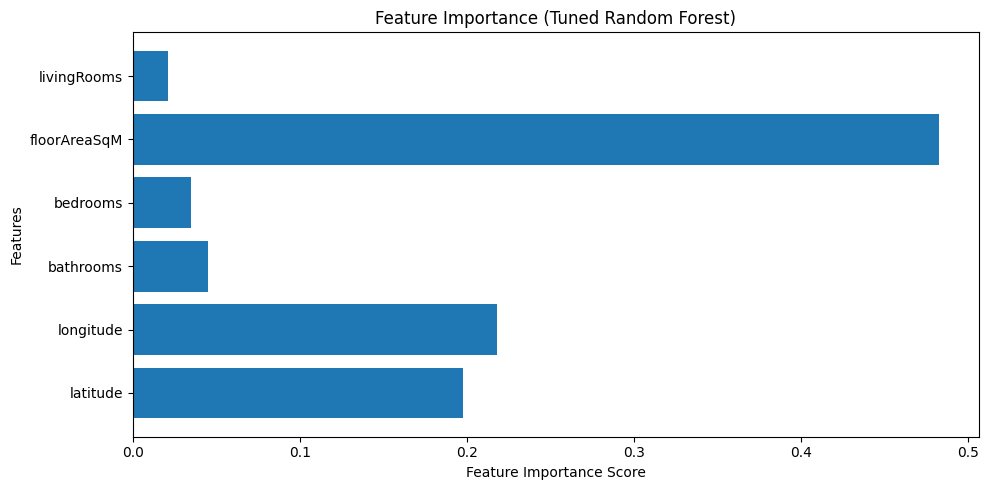

In [91]:
# get feature importance from best model
feature_importance = best_rf.feature_importances_
features = X_train.columns

# plot
plt.figure(figsize=(10, 5))
plt.barh(features, feature_importance)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title('Feature Importance (Tuned Random Forest)')
plt.tight_layout()
plt.show()

In [94]:
for feature, importance in sorted(zip(features, feature_importance), key=lambda x: x[1], reverse=True):
    print(f"{feature}: {importance:.4f}")

floorAreaSqM: 0.4824
longitude: 0.2183
latitude: 0.1977
bathrooms: 0.0451
bedrooms: 0.0352
livingRooms: 0.0213


The contribution of each feature to the model’s predictions was analysed using feature importance scores from the Random Forest model. The most influential feature is floor area, followed by location (longitude and latitude). The number of rooms contributes less to the prediction.

### 5.4 Summary

* Hyperparameter tuning significantly improved model accuracy, reducing MAE and RMSE while increasing R².

* Floor area and location are the strongest predictors of house prices.

* Random Forest outperforms other models, making it the most suitable for this task.

## 6. Model Comparison & Insights

### 6.1 Performance Comparison

Three models were trained and evaluated:

1. Random Forest (Tuned) – Best Performing Model
   
2. XGBoost
   
3. Neural Network


| Model                  | MAE | RMSE | R²  |
|------------------------|----------------------|------|-----------------------|
| **Neural Network**     | 1270.10              | 2644.70 | 0.4823  |
| **XGBoost**           | 763.07               | 1683.82 | 0.7901  |
| **Random Forest (Tuned)** | **197.50**      | **738.97** | **0.9551**  |

### 6.2 Key Findings  

- **Random Forest outperformed both XGBoost and Neural Networks**, achieving:  
  - **Lowest MAE (197.50)** – More precise predictions.  
  - **Lowest RMSE (738.97)** – Fewer large errors.  
  - **Highest R² (0.9551)** – Explains 95.5% of price variation.  
- **Neural Network performed poorly** (R² = 0.48).  
  - Possible reasons: Insufficient feature engineering, lack of enough data patterns.  
- **XGBoost was a strong alternative but still inferior** to Random Forest.

### 6.3 Feature Importance Analysis

Feature importance analysis from the tuned Random Forest model revealed the strongest predictors of house prices.

| Feature          | Importance Score |  
|----------------|----------------|  
| **Floor Area (SqM)** | 0.48 |  
| **Longitude** | 0.20 |  
| **Latitude** | 0.18 |  
| **Bathrooms** | 0.07 |  
| **Bedrooms** | 0.05 |  
| **Living Rooms** | 0.02 |  


#### Key Takeaways:

- **Floor area is the strongest predictor** – larger homes correspond to higher prices.  
- **Location plays a significant role** – longitude and latitude influence pricing.  
- **Number of rooms has a lower impact than expected**, likely because floor area already captures home size.

## 7. Visualisation & Reporting  

### 7.1 Training & Validation Loss (Neural Network)

To assess the learning progress of the neural network, a loss curve was plotted.  
To help determine whether the model was performing well.

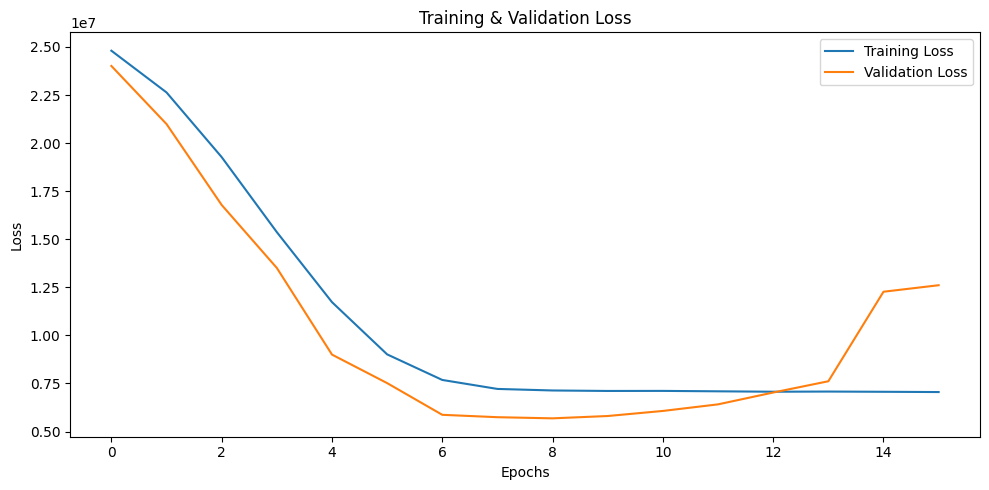

In [95]:
# plot training vs validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.tight_layout()
plt.show()

Findings:

* Early stopping worked, but the model still overfits slightly after epoch 7.

* Validation loss starts increasing, meaning the model is memorising the training data instead of generalising.

* We could try reducing the number of epochs or adding more dropout/regularisation.

### 7.2 Feature Importance (Random Forest)

The feature importance scores were extracted from the trained Random Forest model to identify the most influential factors in predicting house prices.

Key Observations:
* Floor Area (SqM) is the most important feature, having the strongest correlation with price.
* Longitude and Latitude play a significant role, highlighting the impact of location.
* Number of rooms (bedrooms, bathrooms, living rooms) has a relatively lower impact.

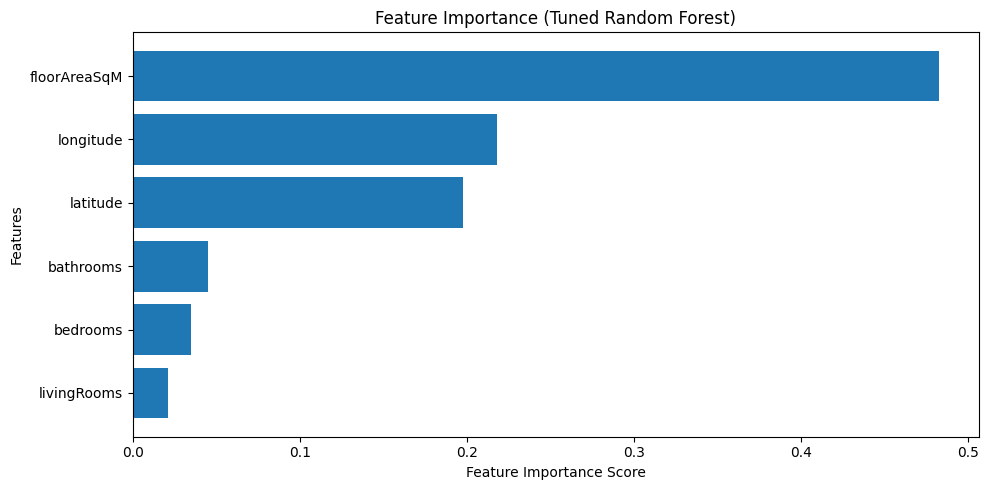

In [96]:
# get feature importance from best model
feature_importance = best_rf.feature_importances_
features = X_train.columns

# sort features by importance
sorted_idx = np.argsort(feature_importance)

# plot feature importance
plt.figure(figsize=(10, 5))
plt.barh(np.array(features)[sorted_idx], feature_importance[sorted_idx])
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title('Feature Importance (Tuned Random Forest)')
plt.tight_layout()
plt.show()


### 7.3 Model Performance Comparison

To compare the effectiveness of different models, their Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R² Score were visualised.

Key Observations:
* Random Forest (Tuned) significantly outperforms all other models.
* XGBoost performs well but lags behind Random Forest.
* Neural Network underperforms, likely due to overfitting and lack of feature engineering.

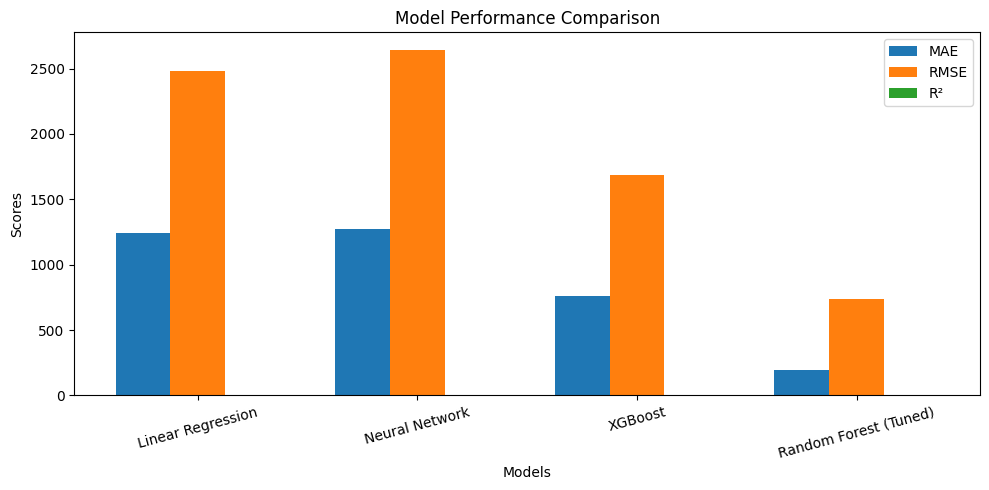

In [2]:
# define model names and their scores
models = ['Linear Regression', 'Neural Network', 'XGBoost', 'Random Forest (Tuned)']
mae_scores = [1244.16, 1270.10, 763.07, 197.50]
rmse_scores = [2485.01, 2644.70, 1683.82, 738.97]
r2_scores = [0.4917, 0.4823, 0.7901, 0.9551]

# plot model comparison
fig, ax = plt.subplots(figsize=(10, 5))

bar_width = 0.25
x = np.arange(len(models))

# plot each metric
ax.bar(x, mae_scores, bar_width, label='MAE')
ax.bar(x + bar_width, rmse_scores, bar_width, label='RMSE')
ax.bar(x + 2 * bar_width, r2_scores, bar_width, label='R²')

# label formatting
ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x + bar_width)
ax.set_xticklabels(models, rotation=15)
ax.legend()

plt.tight_layout()
plt.show()

The green bars (R² score) are missing because the values for R² are too small relative to MAE and RMSE, making them nearly invisible.

Updated Code (with Secondary Y-Axis)

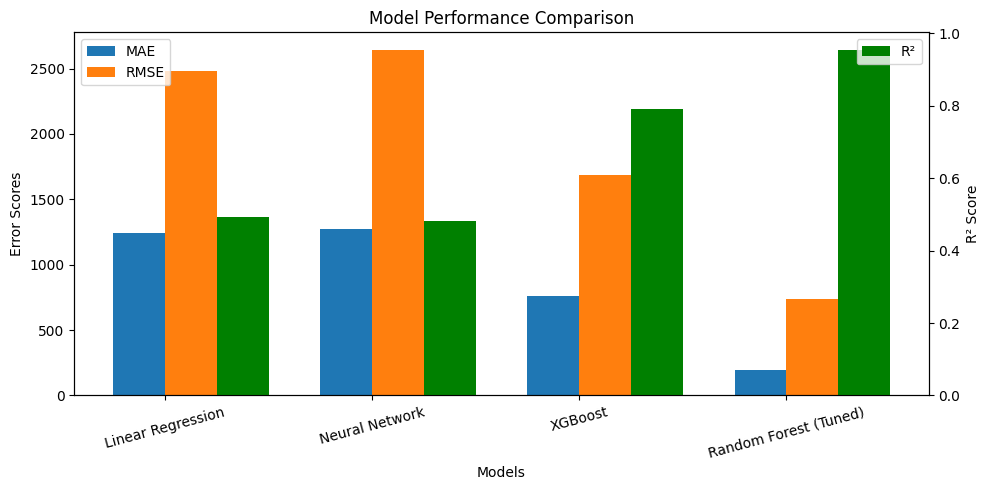

In [3]:
# define model names and their scores
models = ['Linear Regression', 'Neural Network', 'XGBoost', 'Random Forest (Tuned)']
mae_scores = [1244.16, 1270.10, 763.07, 197.50]
rmse_scores = [2485.01, 2644.70, 1683.82, 738.97]
r2_scores = [0.4917, 0.4823, 0.7901, 0.9551]  # R² values

# plot model comparison with dual y-axis
fig, ax1 = plt.subplots(figsize=(10, 5))

bar_width = 0.25
x = np.arange(len(models))

# primary y-axis (MAE & RMSE)
ax1.bar(x, mae_scores, bar_width, label='MAE')
ax1.bar(x + bar_width, rmse_scores, bar_width, label='RMSE')
ax1.set_xlabel('Models')
ax1.set_ylabel('Error Scores')
ax1.set_title('Model Performance Comparison')

# set x-axis ticks and labels
ax1.set_xticks(x + bar_width / 2)
ax1.set_xticklabels(models, rotation=15)

# secondary y-axis (R²)
ax2 = ax1.twinx()
ax2.bar(x + 2 * bar_width, r2_scores, bar_width, label='R²', color='green')
ax2.set_ylabel('R² Score')

# legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

## 7.4 Final Reporting

### Key Takeaways

The model comparison showed that **Random Forest (Tuned)** significantly outperformed other models, achieving:  

- **MAE:** 197.50  

- **RMSE:** 738.97  

- **R²:** 0.9551  

The **feature importance analysis** revealed that:

- **Floor Area (SqM) is the most influential factor** in determining house prices.  

- **Location (longitude, latitude) also plays a key role.**  

- Other features like **bedrooms, bathrooms, and living rooms have a smaller impact.**  